### Tutorial Notebook Showing How sus, infoenginessims work together to make a sim object

In [2]:
#standard imports, these can be done automatically using a conda environemnt
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
# imports to deal with getting nice animations and outputs for matplotlip in jupyter
plt.rcParams["animation.html"] = "jshtml"
from IPython.display import HTML
import matplotlib.animation as animation
%matplotlib inline

# from kyle_tools.info_space import separate_by_state

In [3]:
# I always keep my code in a folder in my home directory called 'source/', and begin with the following:
source_path = os.path.expanduser('~/Project/source/')
sys.path.append(source_path)
# which will enable the following imports:
from sus import protocol_designer as pd
from sus.library.szilard_protocols import blw_szilard

# usually these would not be imported but handled in a separate document, but to show the inner workings 
# of the simtools package, I will manually import some stuff

sim_path = os.path.dirname(source_path + "simtools/infoenginessims/")
sys.path.append(sim_path)

from integrators import rkdeterm_eulerstoch
from dynamics import langevin_underdamped, langevin_overdamped
from simprocedures import basic_simprocedures as sp
from simprocedures import running_measurements as rp
from simulation import Simulation

In [4]:
# first, we have our system, as explained in the sus package tutorial:
system = blw_szilard

system.potential?

In [5]:
# next, we want to generate a starting distribution. Generally its an EQ dist at a certain time (the starting 
# time, here). We take a sample of 10_000 initial conditions from the eq distribution

init_state = system.eq_state(10_000, 0, beta=1)




 found 10006 samples out of 10000

Text(0.5, 0, 'v_y')

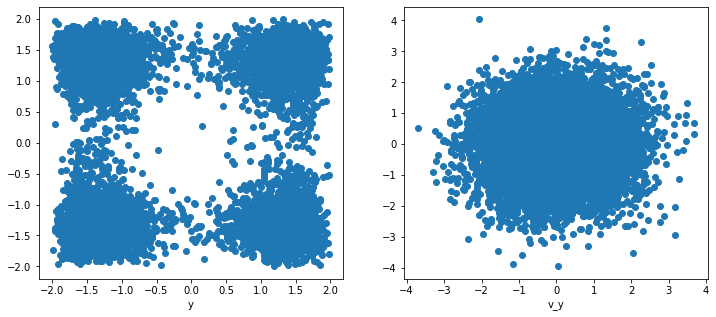

In [6]:
#scatter plot briefly can confirm we have the right dist. 
fig, ax = plt.subplots(1,2, figsize=(12,5))
"""What are the meaning of the indices in the array?"""
ax[0].scatter(init_state[:,0,0], init_state[:,1,0])
ax[0].set_xlabel('x')
ax[0].set_xlabel('y')

ax[1].scatter(init_state[:,0,1], init_state[:,1,1])
ax[1].set_xlabel('v_x')
ax[1].set_xlabel('v_y')

In [7]:
#Now, we set up a sim object, to simulate an equation of motion for the system, with the given protocol and 
#time dependent potential

#FIRST, we choose a dynamic. These cam be built, but we have some built in already for langevin dynamics. 
#Let's go for the full underdamped EOM. For more info look inside the docstrings in the simtools package

gamma, theta, eta = 1, 1, 1

#underdamped langevin dynamics takes 3 parameters and the time dependent force function for our system
dynamic = langevin_underdamped.LangevinUnderdamped(theta, gamma, eta, system.get_external_force)

#it also needs an inertial parameter, the mass. By default all systems have an object mass of 1, but it can 
# be changed
dynamic.mass = system.mass

In [8]:
system.get_external_force

<bound method System.get_external_force of <sus.protocol_designer.system.System object at 0x7fb206b6e1c0>>

In [9]:
# SECOND, we need an integrator to integrate the dynamic. Here the integrator is very simple, RK4 for the 
# deterministic part and Euler for the stochastic. This is a place where we could optimize for more intelligent 
# integrators for sure, but they mostly get the job done as is. Again, check the relevant docstrings for more 
# info.

integrator = rkdeterm_eulerstoch.RKDetermEulerStoch(dynamic)



In [10]:
# Third, we set up procedues to be done. They can happen before the simualtion, throughout it, or at the end. 
# Check relevant docsrings inside of simtools for more info
# from simprocedures import basic_simprocedures as sp
# from simprocedures import running_measurements as rp
# get_dW = get the differential work


procedures = [
            sp.ReturnFinalState(),
            sp.MeasureAllState(trial_request=slice(0, 300)),
            rp.MeasureAllValue(rp.get_dW, 'all_W'), 
            rp.MeasureFinalValue(rp.get_dW, 'final_W')]



# These four procedures do exactly what it sounds like they would do. The first will give us just the final state
# for all trials. The second measures the whole simulation for the first 100 trials. The third measures work over
# time, and the last gives us the next work for the whole protocol.

In [11]:
# Finally, we decide what dt we are going to use:
dt = .0005
nsteps = int(system.protocol.t_f/dt)
# and create a Simulation object
sim = Simulation(integrator.update_state, procedures, nsteps, dt, initial_state=init_state)

# and associate the system with it, for future reference
sim.system = system


In [12]:
#Now this is all set up, we can run a simulation:
sim.output = sim.run(verbose=True)

 step 2000 of 2000 complete

In [13]:
#extract the results for viewing. The sim.output Bunch object acts a lot like a container for dictionaries 
# and numpy arrays that are callable as attributes
all_state = sim.output.all_state['states']
final_state = sim.output.final_state
final_W = sim.output.final_W
all_W = sim.output.all_W


In [14]:
#all the outputs are numpy arrays
print(all_W.shape,':trials, steps')

print(all_state.shape,':trials, steps, dimensions, attributes per dimension')

(10000, 2001) :trials, steps
(300, 2001, 2, 2) :trials, steps, dimensions, attributes per dimension


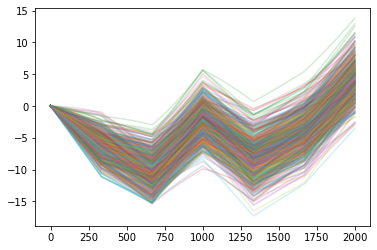

In [15]:
#work over time for the first 500 trials
plt.plot(all_W[:500,:].transpose(), alpha=.2);

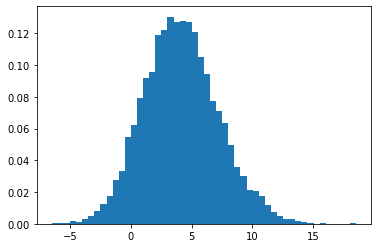

In [16]:
#just net work for all trials:
plt.hist(final_W, bins=50, density=True);

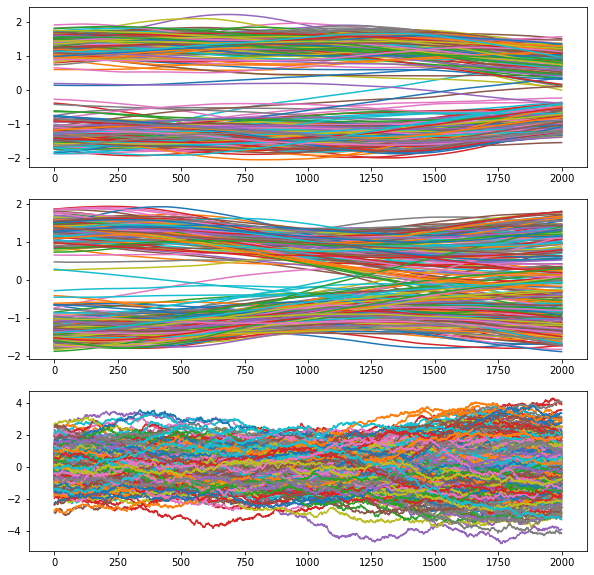

In [17]:
fig,ax = plt.subplots(3, figsize=(10,10))
#here are x,v and v_x plots over time
"""What is v_x plot?"""
ax[0].plot(all_state[:,:,0,0].transpose()); # x vs step
ax[1].plot(all_state[:,:,1,0].transpose()); # y vs step
ax[2].plot(all_state[:,:,0,1].transpose()); # v_x vs step



In [21]:
import kyle_tools as kt

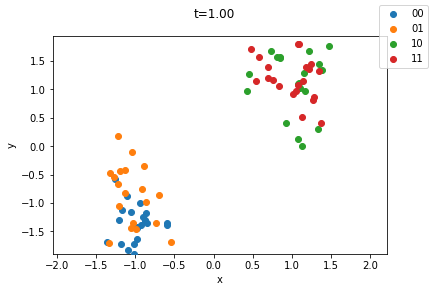

In [23]:
ani,_,_ = kt.animate_sim(all_state, frame_skip=10, color_by_state=True)

HTML(ani.to_jshtml(fps=30))

In [19]:
import os
fileName = [x.split("_") for x in os.listdir("./parameter/") if x.endswith(".gif")]
parameterList = list(map(lambda x: (float(x[2]), float(x[4]), \
                                    [float(y) for y in x[6].replace(".gif", "").split(",")]), fileName))
print(parameterList)

[(4.0, 1.0, [1.0, 50.0, 10.0]), (1.0, 4.0, [4.0, 80.0, 10.0]), (1.0, 3.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 20.0, 10.0]), (1.0, 5.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 30.0, 10.0]), (1.0, 2.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 40.0, 10.0]), (1.0, 1.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 10.0, 10.0]), (1.0, 10.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 60.0, 10.0]), (1.0, 6.0, [4.0, 80.0, 10.0]), (1.0, 9.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 70.0, 10.0]), (4.0, 1.0, [1.0, 80.0, 10.0]), (1.0, 8.0, [4.0, 80.0, 10.0]), (4.0, 1.0, [1.0, 0.0, 10.0]), (1.0, 7.0, [4.0, 80.0, 10.0])]


In [20]:
def get_initial_and_final_xy_coord(all_state, times=[0,1], system=None, frame_skip=30, which_axes=None, 
                                   axes_names=None, color_by_state=None, key_state=None, color_key=None, 
                                   legend=True, alpha=None, fig_ax=None, **pot_kwargs):

    if color_by_state is not None:
        if key_state is not None:
            state_lookup = separate_by_state(key_state)
        else:
            state_lookup = separate_by_state(all_state[:, 0, ...])

    N, nsteps, N_dim = np.shape(all_state)[0], np.shape(all_state)[1], np.shape(all_state)[2]

    for i in range(N_dim):
        if np.size(np.shape(all_state)) == 4:
            which_axes = [np.s_[..., i, 0] for i in range(N_dim)]
        if np.size(np.shape(all_state)) == 3:
            which_axes = [np.s_[..., i] for i in range(N_dim)]

    x_array = [all_state[item] for item in which_axes]
    
    samples = np.linspace(0, nsteps-1, nsteps)[::frame_skip]
    time = np.linspace(times[0], times[1], nsteps + 1)
    

    x = x_array[0]
    y = x_array[1]
    
    initial_final_phase_space_dict = {}
    
    for key in ["00", "01", "10", "11"]:
        initial_final_phase_space_dict[key] = {
            "initial": (x[state_lookup[key], 0], y[state_lookup[key], 0]),
            "final": (x[state_lookup[key], int(samples[-1])], y[state_lookup[key], int(samples[-1])]),
        }
    
    return initial_final_phase_space_dict

def ratio_of_good_points(keys, _dict):
    _returnDict = {
        
    }
    
    colorCode = {"00": "blue", "01": "yellow", "10": "green", "11": "red"}
    
    
    
    for _k in keys:        
        total = len(_dict[_k]["final"][1])
        print(_k)
        number_of_good_points = 0
        if _k in ["10", "11"]:
            number_of_good_points = len(np.where(initial_final_phase_space_dict[_k]["final"][1] > 0)[0])
        if _k in ["00", "01"]:
            number_of_good_points = len(np.where(initial_final_phase_space_dict[_k]["final"][1] < 0)[0])
        
        goodPointsIndex = np.where(initial_final_phase_space_dict[_k]["final"][1] < 0)[0]
        goodPoints_x_coordinates = initial_final_phase_space_dict[_k]["final"][0][goodPointsIndex]


        
        print("number of good points: ", number_of_good_points)
        _returnDict[_k] = {
            "goodRatio": number_of_good_points/total * 100,
            "mean_x": np.mean(goodPoints_x_coordinates),
            "var_x": np.var(goodPoints_x_coordinates)
        }
        print(f"key: {_k} ({colorCode[_k]}) = {number_of_good_points/total * 100}")
        print(f"mean: {np.mean(goodPoints_x_coordinates)}, var: {np.var(goodPoints_x_coordinates)}")
        print("=" * 100)
    return _returnDict

    
_d = ratio_of_good_points(["00", "01", "10", "11"], initial_final_phase_space_dict)
print(_d)

NameError: name 'initial_final_phase_space_dict' is not defined

In [ ]:
def rerunAllTheSimulations(parameterList):
    for x in parameterList:
        runSimulationFunction(x, overwrite=True)


In [527]:
# usually its goo to normalize before stretching, so you dont loose track of the timescale from doing 
# multiple stretches
from quick_sim import setup_sim
from datetime import datetime
def time_stretch_simulation(_time_stretch, _damping, _sim_parameters):   
    print(_sim_parameters)
    system.protocol.normalize()
    system.protocol.time_stretch(_time_stretch)
    sim = setup_sim(system, init_state, sim_params=_sim_parameters, dt=.005, damping=_damping)
    sim.output = sim.run(verbose=True)

    return sim

In [513]:
_damping_list = np.arange(0, 22, 2)
label="damping_sweep"


for _damping in _damping_list:
    runSimulationFunction([_time_stretch, float(_damping), _sim_parameters], label = label)

# Theta Sweep

In [537]:
_time_stretch = 4
_damping = 1
_sim_parameters = [1, 6, 10]

_time_stretch = 4
_damping = 1
thetaList = [float(x) for x in np.linspace(0, 100, 11)]
thetaList = [6]
_gamma = 1
_eta = 10
label="theta_sweep"


time_stretch: 4, _damping: 1, _gamma: 1, _theta: 6, _eta: 10
[1, 6, 10]
 step 800 of 800 complete00
number of good points:  162
key: 00 (blue) = 68.35443037974683
mean: -0.11877318330257602, var: 1.7352693027130954
01
number of good points:  182
key: 01 (yellow) = 67.15867158671587
mean: -0.24016380399147175, var: 1.7124689973088114
10
number of good points:  152
key: 10 (green) = 64.68085106382979
mean: -0.042548990733596706, var: 1.7237926767083582
11
number of good points:  177
key: 11 (red) = 68.8715953307393
mean: 0.16827954584320426, var: 1.6271487527125585
You are not saving data


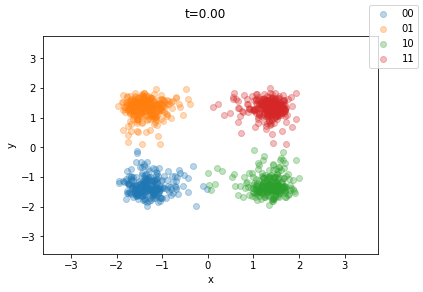

In [538]:
for _theta in thetaList:
    print(f"time_stretch: {_time_stretch}, _damping: {_damping}, _gamma: {_gamma}"
          + f", _theta: {_theta}, _eta: { _eta}")
    runSimulationFunction([_time_stretch, _damping, [_gamma, _theta, _eta]], label = label, save = False)

In [490]:
json.dumps(s)

'{"date": "2023-01-27 19:51:26.474973", "ts": 4, "damping": 0, "sim_parameters": [1, 60, 10], "goodPercentages": {"00": {"goodRatio": 64.55696202531645, "mean_x": -0.29141264704654746, "var_x": 1.353715094590675}, "01": {"goodRatio": 56.08856088560885, "mean_x": -0.17125891199084467, "var_x": 1.2967645857503542}, "10": {"goodRatio": 60.0, "mean_x": -0.11583059252304001, "var_x": 1.3170171113156572}, "11": {"goodRatio": 73.54085603112841, "mean_x": 0.1495979975926813, "var_x": 1.2128369487213966}}}'

In [494]:
with open("parameter/result.json", "r") as rf:
    data = json.load(rf)
    data["result"].append(result_dict)


In [519]:
def runSimulationFunction(parameterList: [float, float, [float]], label = "", \
                          overwrite = False, save = False)->None:
    _time_stretch, _damping, _sim_parameters = parameterList
    
    sim = time_stretch_simulation(_time_stretch, _damping, _sim_parameters)
    
    all_state = sim.output.all_state['states']
    initial_final_phase_space_dict = get_initial_and_final_xy_coord(all_state[:,:,:,0], 
                                        frame_skip=10, color_by_state=True)
    
    # to create a result dict and put into json for record
    
    result_dict = {
        "label": label,
        "date": str(datetime.now()),
        "ts": _time_stretch,
        "damping": _damping,
        "sim_parameters": _sim_parameters,
        "statistics": ratio_of_good_points(["00", "01", "10", "11"], initial_final_phase_space_dict)
    }
    
    ani,_,_ = kt.animate_sim(all_state[:,:,:,0], frame_skip=10, color_by_state=True)
    parameter_list = ','.join([str(x) for x in _sim_parameters])
    filename = f"parameter/animation_ts_{_time_stretch}_damping_{_damping}_parameter_{parameter_list}_times.gif"
    
    # writing the things into the json file

    if not os.path.isfile(filename) or overwrite:    
        if save:
            with open("parameter/result.json", "r") as rf:
                data = json.load(rf)
                data.append(result_dict)

                with open("parameter/result.json", "w") as wf:
                    json.dump(data, wf)
            print(filename, "is saved.")
            ani.save(filename,writer='imagemagick', fps=60)
        print("You are not saving data")
    else:
        print("The set of parameters has already been simulated.")

In [ ]:
from datetime import datetime
import json

In [539]:
_time_stretch = 4
_damping = 1
_sim_parameters = [1, 6, 10]
sim = time_stretch_simulation(_time_stretch, _damping, _sim_parameters)
# animation_ts_1_damping_0.5_parameter_10,60,1_times

all_state = sim.output.all_state['states']
initial_final_phase_space_dict = get_initial_and_final_xy_coord(all_state[:,:,:,0], 
                                    frame_skip=10, color_by_state=True)


result_dict = {
    "date": str(datetime.now()),
    "ts": _time_stretch,
    "damping": _damping,
    "sim_parameters": _sim_parameters,
    "statistics": ratio_of_good_points(["00", "01", "10", "11"], initial_final_phase_space_dict)
}

parameter_list = ','.join([str(x) for x in _sim_parameters])
filename = f"parameter/animation_ts_{_time_stretch}_damping_{_damping}_parameter_{parameter_list}_times.gif"
if os.path.isfile(filename):
    print("You already simulated this set")
else:
    print("this is a new simulation")

[1, 6, 10]
 step 800 of 800 complete00
number of good points:  133
key: 00 (blue) = 56.118143459915615
mean: 0.017533239075659332, var: 1.8101071106843167
01
number of good points:  129
key: 01 (yellow) = 47.601476014760145
mean: 0.0016661081548555886, var: 1.580545442155815
10
number of good points:  126
key: 10 (green) = 53.61702127659574
mean: 0.21304779876960175, var: 1.8911088083414107
11
number of good points:  127
key: 11 (red) = 49.416342412451364
mean: 0.3099211843691861, var: 2.202166060801736
this is a new simulation


In [540]:
_time_stretch = 4
_damping = 1
_sim_parameters = [1, 60, 10]
sim = time_stretch_simulation(_time_stretch, _damping, _sim_parameters)
# animation_ts_1_damping_0.5_parameter_10,60,1_times

all_state = sim.output.all_state['states']
initial_final_phase_space_dict = get_initial_and_final_xy_coord(all_state[:,:,:,0], 
                                    frame_skip=10, color_by_state=True)


result_dict = {
    "date": str(datetime.now()),
    "ts": _time_stretch,
    "damping": _damping,
    "sim_parameters": _sim_parameters,
    "statistics": ratio_of_good_points(["00", "01", "10", "11"], initial_final_phase_space_dict)
}

parameter_list = ','.join([str(x) for x in _sim_parameters])
filename = f"parameter/animation_ts_{_time_stretch}_damping_{_damping}_parameter_{parameter_list}_times.gif"
if os.path.isfile(filename):
    print("You already simulated this set")
else:
    print("this is a new simulation")

[1, 60, 10]
 step 800 of 800 complete00
number of good points:  168
key: 00 (blue) = 70.88607594936708
mean: -0.06553472259678014, var: 1.6687893536687852
01
number of good points:  175
key: 01 (yellow) = 64.57564575645756
mean: -0.2286064903263266, var: 1.70092202359381
10
number of good points:  166
key: 10 (green) = 70.63829787234043
mean: 0.01781432491873998, var: 1.704148660678778
11
number of good points:  180
key: 11 (red) = 70.03891050583657
mean: 0.29797112541721044, var: 1.5767335583599262
this is a new simulation


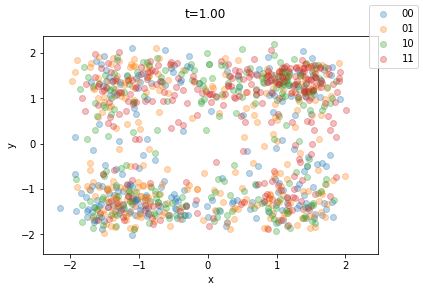

In [476]:
ani,_,_ = kt.animate_sim(all_state[:,:,:,0], frame_skip=10, color_by_state=True)
HTML(ani.to_jshtml(fps=30))

In [477]:
parameter_list = ','.join([str(x) for x in _sim_parameters])
filename = f"parameter/animation_ts_{_time_stretch}_damping_{_damping}_parameter_{parameter_list}_times.gif"
overwrite = True
if not os.path.isfile(filename) or overwrite:    
    with open("parameter/result.json", "r") as rf:
        data = json.load(rf)
        data["result"].append(result_dict)
        with open("parameter/result.json", "w") as wf:
            json.dump(data, wf)
    print(filename, "is saved.")
    ani.save(filename,writer='imagemagick', fps=60)
else:
    print("The set of parameters has already been simulated.")



parameter/animation_ts_4_damping_100_parameter_1,60,10_times.gif is saved.


72.15189873417721
85.60885608856088
85.53191489361703
72.37354085603113


In [228]:
number_of_bad_points/(number_of_good_points + number_of_bad_points)

0.27848101265822783

In [202]:
HTML(ani.to_jshtml(fps=30))

In [194]:
np.array([0, 1, 2, 3, 4])[2::-1]


array([2, 1, 0])

In [ ]:
kt.animate_sim(all_state[:,:,:,0], frame_skip=10, color_by_state=True)

In [ ]:
def animate_sim(all_state, times=[0,1], system=None, frame_skip=30, which_axes=None, axes_names=None, color_by_state=None, key_state=None, color_key=None, legend=True, alpha=None, fig_ax=None, **pot_kwargs):

    if color_by_state is not None:
        if key_state is not None:
            state_lookup = separate_by_state(key_state)
        else:
            state_lookup = separate_by_state(all_state[:, 0, ...])

    N, nsteps, N_dim = np.shape(all_state)[0], np.shape(all_state)[1], np.shape(all_state)[2]

    if which_axes is None:
        assert np.size(np.shape(all_state)) in (3, 4), 'not a recognized all_state format, use which_axes kwarg or all_state of dimension [N, Nsteps, D, 2]/[N, Nsteps, D]'
        for i in range(N_dim):
            if np.size(np.shape(all_state)) == 4:
                which_axes = [np.s_[..., i, 0] for i in range(N_dim)]
            if np.size(np.shape(all_state)) == 3:
                which_axes = [np.s_[..., i] for i in range(N_dim)]

    assert len(which_axes) == 2, 'can only plot 2 coordinates at once'

    x_array = [all_state[item] for item in which_axes]

    if fig_ax is None:
        fig, ax = plt.subplots()

    else:
        fig, ax = fig_ax
        
    samples = np.linspace(0, nsteps-1, nsteps)[::frame_skip]
    time = np.linspace(times[0], times[1], nsteps + 1)
    opacity=alpha
    if opacity is None:
        opacity = min(1, 300/N)

    x = x_array[0]
    y = x_array[1]

    names = axes_names

    if axes_names is None:
        names = ('x', 'y')


    x_lim = (np.min(x), np.max(x))
    y_lim = (np.min(y), np.max(y))
    
    txt = fig.suptitle('t={:.2f}'.format(times[0]))

    scat_kwargs = {'alpha':opacity, 'zorder':10}

    if color_by_state is None:
        scat = ax.scatter(x[:, 0], y[:, 0], **scat_kwargs)
    else:
        if color_key is not None:
            color_lookup = dict(zip(state_lookup, color_key))
            scat = [ax.scatter(x[state_lookup[key], 0], y[state_lookup[key], 0], c=color_lookup[key], **scat_kwargs) for key in state_lookup]
        else:
            scat = [ax.scatter(x[state_lookup[key], 0], y[state_lookup[key], 0], **scat_kwargs) for key in state_lookup]
        if legend:
            fig.legend(state_lookup)
    
    if system is not None:
        pot, pout = system.show_potential(times[0], ax=ax, cbar=False, surface=False, **pot_kwargs)
        pot.title.set_visible(False)
    ax.set(xlim=x_lim, ylim=y_lim, xlabel=names[0], ylabel=names[1])

See? It is better, but it isnt great. Ideally you would have the Orange/Blue evenly split along the bottom and the Red/Green evenly split along the top. Try some more stuff. Specifically investigate the dynamic parameters gamma, theta, eta and also the energy scale of the potential through system.potential.scale